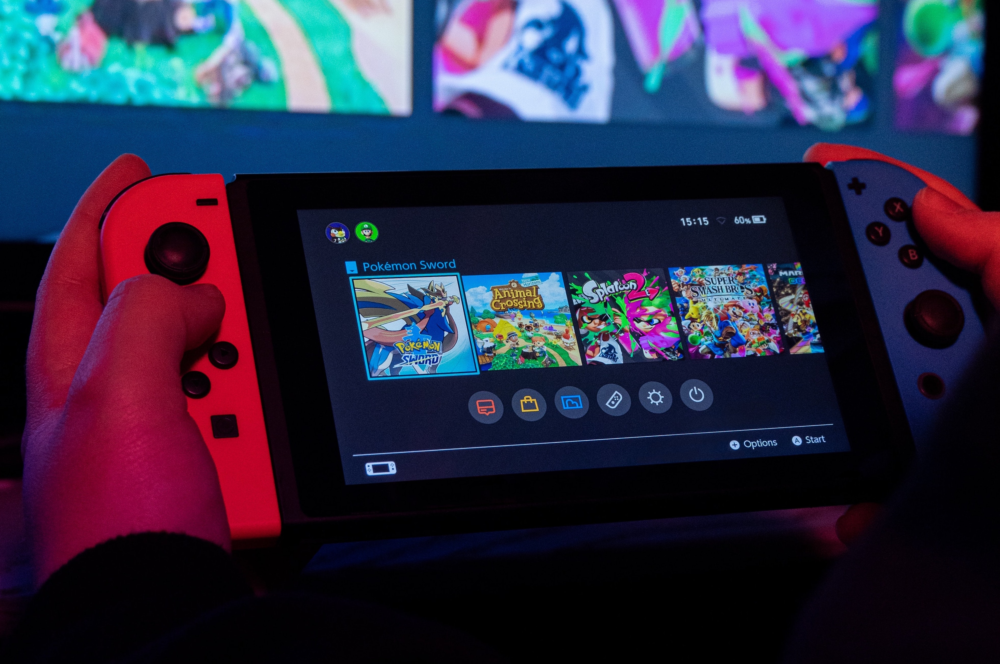

Video games are big business: the global gaming market is projected to be worth more than $300 billion by 2027 according to Mordor Intelligence. With so much money at stake, the major game publishers are hugely incentivized to create the next big hit. But are games getting better, or has the golden age of video games already passed?

In this project, you'll analyze video game critic and user scores as well as sales data for the top 400 video games released since 1977. You'll search for a golden age of video games by identifying release years that users and critics liked best, and you'll explore the business side of gaming by looking at game sales data.

Your search will involve joining datasets and comparing results with set theory. You'll also filter, group, and order data. Make sure you brush up on these skills before trying this project! The database contains two tables. Each table has been limited to 400 rows for this project, but you can find the complete dataset with over 13,000 games on Kaggle.

### `game_sales` table

| Column | Definition | Data Type |
|-|-|-|  
|name|Name of the video game|`varchar`|
|platform|Gaming platform|`varchar`|
|publisher|Game publisher|`varchar`|
|developer|Game developer|`varchar`|
|games_sold|Number of copies sold (millions)|`float`|
|year|Release year|`int`|

### `reviews` table

| Column | Definition | Data Type |
|-|-|-|
|name|Name of the video game|`varchar`|  
|critic_score|Critic score according to Metacritic|`float`|
|user_score|User score according to Metacritic|`float`|


### `users_avg_year_rating` table

| Column | Definition | Data Type |
|-|-|-|
|year| Release year of the games reviewed |`int`|  
|num_games| Number of games released that year |`int`|
|avg_user_score| Average score of all the games ratings for the year |`float`|

### `critics_avg_year_rating` table

| Column | Definition | Data Type |
|-|-|-|
|year| Release year of the games reviewed |`int`|  
|num_games| Number of games released that year |`int`|
|avg_critic_score| Average score of all the games ratings for the year |`float`|



In [1]:
SELECT *
FROM game_sales
ORDER BY games_sold DESC
LIMIT 10;


,name,platform,publisher,developer,games_sold,year
0,Wii Sports for Wii,Wii,Nintendo,Nintendo EAD,82.90,2006
1,Super Mario Bros. for NES,NES,Nintendo,Nintendo EAD,40.24,1985
2,Counter-Strike: Global Offensive for PC,PC,Valve,Valve Corporation,40.00,2012
3,Mario Kart Wii for Wii,Wii,Nintendo,Nintendo EAD,37.32,2008
4,PLAYERUNKNOWN'S BATTLEGROUNDS for PC,PC,PUBG Corporation,PUBG Corporation,36.60,2017
5,Minecraft for PC,PC,Mojang,Mojang AB,33.15,2010
6,Wii Sports Resort for Wii,Wii,Nintendo,Nintendo EAD,33.13,2009
7,Pokemon Red / Green / Blue Version for GB,GB,Nintendo,Game Freak,31.38,1998
8,New Super Mario Bros. for DS,DS,Nintendo,Nintendo EAD,30.80,2006
9,New Super Mario Bros. Wii for Wii,Wii,Nintendo,Nintendo EAD,30.30,2009


In [6]:
SELECT 
    gs.year,
    COUNT(gs.name) AS num_games,
    ROUND(AVG(r.critic_score), 2) AS avg_critic_score
FROM game_sales gs
JOIN reviews r
ON gs.name = r.name
GROUP BY gs.year
HAVING COUNT(gs.name) >= 4
ORDER BY avg_critic_score DESC
LIMIT 10;


,year,num_games,avg_critic_score
0,1998,10,9.32
1,2004,11,9.03
2,2002,9,8.99
3,1999,11,8.93
4,2001,13,8.82
5,2011,26,8.76
6,2016,13,8.67
7,2013,18,8.66
8,2008,20,8.63
9,2017,13,8.62


In [7]:
SELECT
    c.year,
    c.num_games,
    c.avg_critic_score,
    u.avg_user_score,
    (c.avg_critic_score - u.avg_user_score) AS diff
FROM critics_avg_year_rating c
JOIN users_avg_year_rating u
ON c.year = u.year
WHERE c.avg_critic_score > 9
   OR u.avg_user_score > 9
ORDER BY c.year ASC;


,year,num_games,avg_critic_score,avg_user_score,diff
0,1997,8,7.93,9.50,-1.57
1,1998,10,9.32,9.40,-0.08
2,2004,11,9.03,8.55,0.48
3,2008,20,8.63,9.03,-0.40
4,2009,20,8.55,9.18,-0.63
5,2010,23,8.41,9.24,-0.83
